Importing Libraries

In [63]:
import numpy as np #NumPy is a Python library used for working with arrays and matrices
import pandas as pd # read and writing data files
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt # Used for plotting graphs
%matplotlib inline 
import plotly.express as px
import dtale
import klib
import seaborn as sns # for plotting graphs
import os
import pickle
from imblearn.over_sampling import SMOTE, ADASYN # for oversampling
from sklearn.model_selection import train_test_split    #train and test split
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score # for model evaluation
from sklearn.preprocessing import LabelEncoder,OrdinalEncoder # for 
from sklearn.metrics import accuracy_score


In [64]:
train = pd.read_csv('Datasets/HR Analytics Employee Promotion Data/train.csv')
test = pd.read_csv('Datasets/HR Analytics Employee Promotion Data/test.csv')

In [65]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  awards_won?           54808 non-null  int64  
 11  avg_training_score    54808 non-null  int64  
 12  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(7), object(5)
memory usage: 5.4+ MB


In [66]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23490 entries, 0 to 23489
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           23490 non-null  int64  
 1   department            23490 non-null  object 
 2   region                23490 non-null  object 
 3   education             22456 non-null  object 
 4   gender                23490 non-null  object 
 5   recruitment_channel   23490 non-null  object 
 6   no_of_trainings       23490 non-null  int64  
 7   age                   23490 non-null  int64  
 8   previous_year_rating  21678 non-null  float64
 9   length_of_service     23490 non-null  int64  
 10  awards_won?           23490 non-null  int64  
 11  avg_training_score    23490 non-null  int64  
dtypes: float64(1), int64(6), object(5)
memory usage: 2.2+ MB


In [67]:
train.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won?,avg_training_score,is_promoted
count,54808.000000,54808,54808,52399,54808,54808,54808.000000,54808.000000,50684.000000,54808.000000,54808.000000,54808.000000,54808.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,16840,12343,36669,38496,30446,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,39195.830627,NaN,NaN,NaN,NaN,NaN,1.253011,34.803915,3.329256,5.865512,0.023172,63.386750,0.085170
std,22586.581449,NaN,NaN,NaN,NaN,NaN,0.609264,7.660169,1.259993,4.265094,0.150450,13.371559,0.279137
min,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,39.000000,0.000000
25%,19669.750000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,51.000000,0.000000
50%,39225.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,60.000000,0.000000
75%,58730.500000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,0.000000,76.000000,0.000000


In [68]:
test.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won?,avg_training_score
count,23490.000000,23490,23490,22456,23490,23490,23490.000000,23490.000000,21678.000000,23490.000000,23490.000000,23490.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,7315,5299,15578,16596,13078,NaN,NaN,NaN,NaN,NaN,NaN
mean,39041.399149,NaN,NaN,NaN,NaN,NaN,1.254236,34.782929,3.339146,5.810387,0.022776,63.263133
std,22640.809201,NaN,NaN,NaN,NaN,NaN,0.600910,7.679492,1.263294,4.207917,0.149191,13.411750
min,3.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,39.000000
25%,19370.250000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,51.000000
50%,38963.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,60.000000
75%,58690.000000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,0.000000,76.000000


In [69]:
data = train.merge(test,how='outer')
data

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49,0.0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60,0.0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50,0.0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50,0.0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
78293,53478,Legal,region_2,Below Secondary,m,sourcing,1,24,3.0,1,0,61,NaN
78294,25600,Technology,region_25,Bachelor's,m,sourcing,1,31,3.0,7,0,74,NaN
78295,45409,HR,region_16,Bachelor's,f,sourcing,1,26,4.0,4,0,50,NaN
78296,1186,Procurement,region_31,Bachelor's,m,sourcing,3,27,NaN,1,0,70,NaN


In [70]:
data.describe(include='all')

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won?,avg_training_score,is_promoted
count,78298.000000,78298,78298,74855,78298,78298,78298.000000,78298.000000,72362.000000,78298.000000,78298.000000,78298.000000,54808.000000
unique,NaN,9,34,3,2,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Sales & Marketing,region_2,Bachelor's,m,other,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,24155,17642,52247,55092,43524,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,39149.500000,NaN,NaN,NaN,NaN,NaN,1.253378,34.797619,3.332219,5.848974,0.023053,63.349664,0.085170
std,22602.830026,NaN,NaN,NaN,NaN,NaN,0.606766,7.665928,1.260982,4.248070,0.150073,13.383664,0.279137
min,1.000000,NaN,NaN,NaN,NaN,NaN,1.000000,20.000000,1.000000,1.000000,0.000000,39.000000,0.000000
25%,19575.250000,NaN,NaN,NaN,NaN,NaN,1.000000,29.000000,3.000000,3.000000,0.000000,51.000000,0.000000
50%,39149.500000,NaN,NaN,NaN,NaN,NaN,1.000000,33.000000,3.000000,5.000000,0.000000,60.000000,0.000000
75%,58723.750000,NaN,NaN,NaN,NaN,NaN,1.000000,39.000000,4.000000,7.000000,0.000000,76.000000,0.000000


In [71]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 78298 entries, 0 to 78297
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           78298 non-null  int64  
 1   department            78298 non-null  object 
 2   region                78298 non-null  object 
 3   education             74855 non-null  object 
 4   gender                78298 non-null  object 
 5   recruitment_channel   78298 non-null  object 
 6   no_of_trainings       78298 non-null  int64  
 7   age                   78298 non-null  int64  
 8   previous_year_rating  72362 non-null  float64
 9   length_of_service     78298 non-null  int64  
 10  awards_won?           78298 non-null  int64  
 11  avg_training_score    78298 non-null  int64  
 12  is_promoted           54808 non-null  float64
dtypes: float64(2), int64(6), object(5)
memory usage: 8.4+ MB


C:\Users\VJ\AppData\Local\Temp\ipykernel_16168\1688884446.py:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<AxesSubplot: >

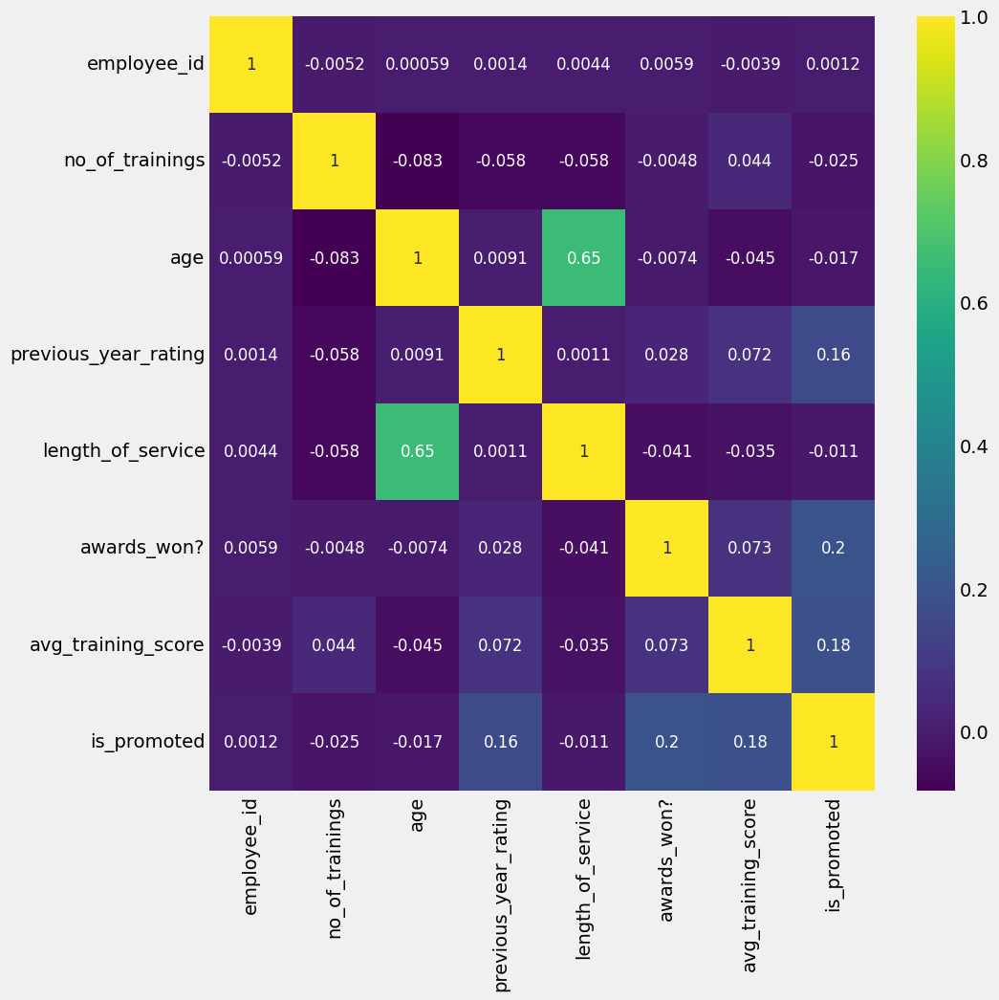

In [72]:
plt.figure(figsize=(10, 10))
sns.heatmap(data.corr(), annot=True, cmap="viridis", annot_kws={"size":12})    
#viridis: A perceptually uniform colormap that ranges from dark blue to bright yellow.

array([[<AxesSubplot: title={'center': 'employee_id'}>,
        <AxesSubplot: title={'center': 'no_of_trainings'}>,
        <AxesSubplot: title={'center': 'age'}>],
       [<AxesSubplot: title={'center': 'previous_year_rating'}>,
        <AxesSubplot: title={'center': 'length_of_service'}>,
        <AxesSubplot: title={'center': 'awards_won?'}>],
       [<AxesSubplot: title={'center': 'avg_training_score'}>,
        <AxesSubplot: title={'center': 'is_promoted'}>, <AxesSubplot: >]],
      dtype=object)

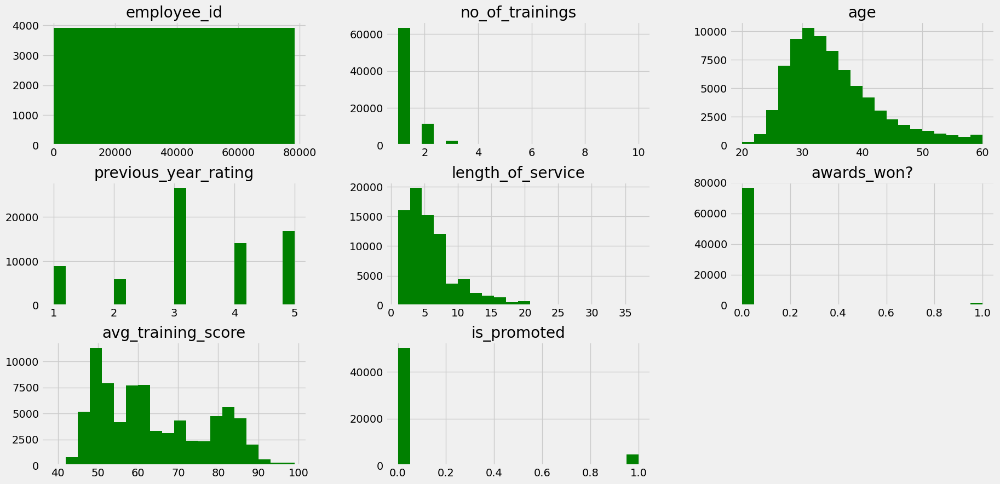

In [73]:
data.hist(bins = 20, figsize = (20,10), color = 'g')


Large dataset detected, using 10000 random samples for the plots. Summary statistics are still based on the entire dataset.


<AxesSubplot: xlabel='avg_training_score', ylabel='Density'>

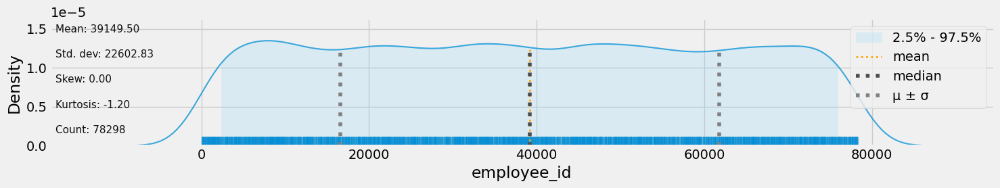

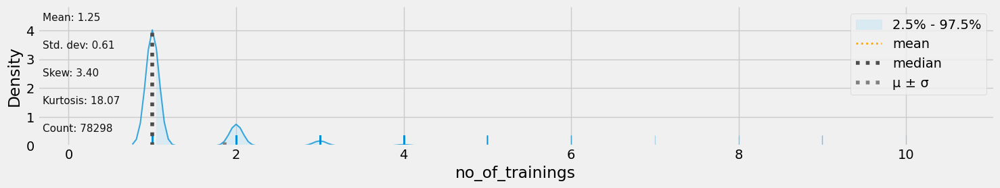

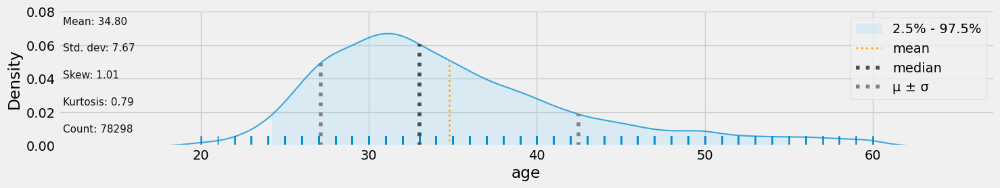

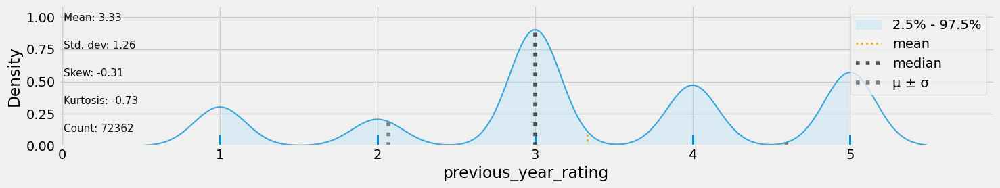

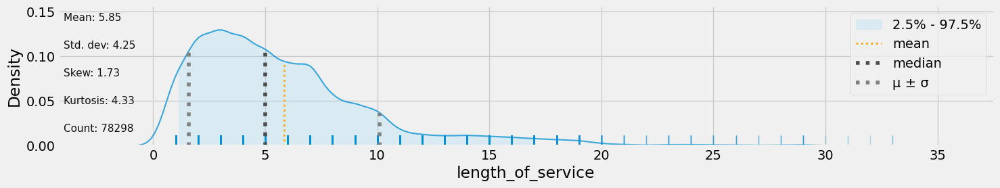

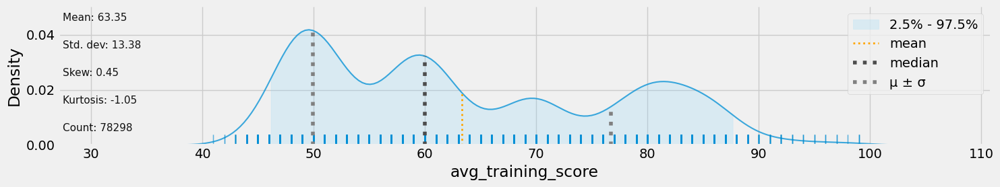

In [74]:
klib.dist_plot(data)     #Two-dimensional visualization of the distribution of non binary numerical features

GridSpec(6, 6)

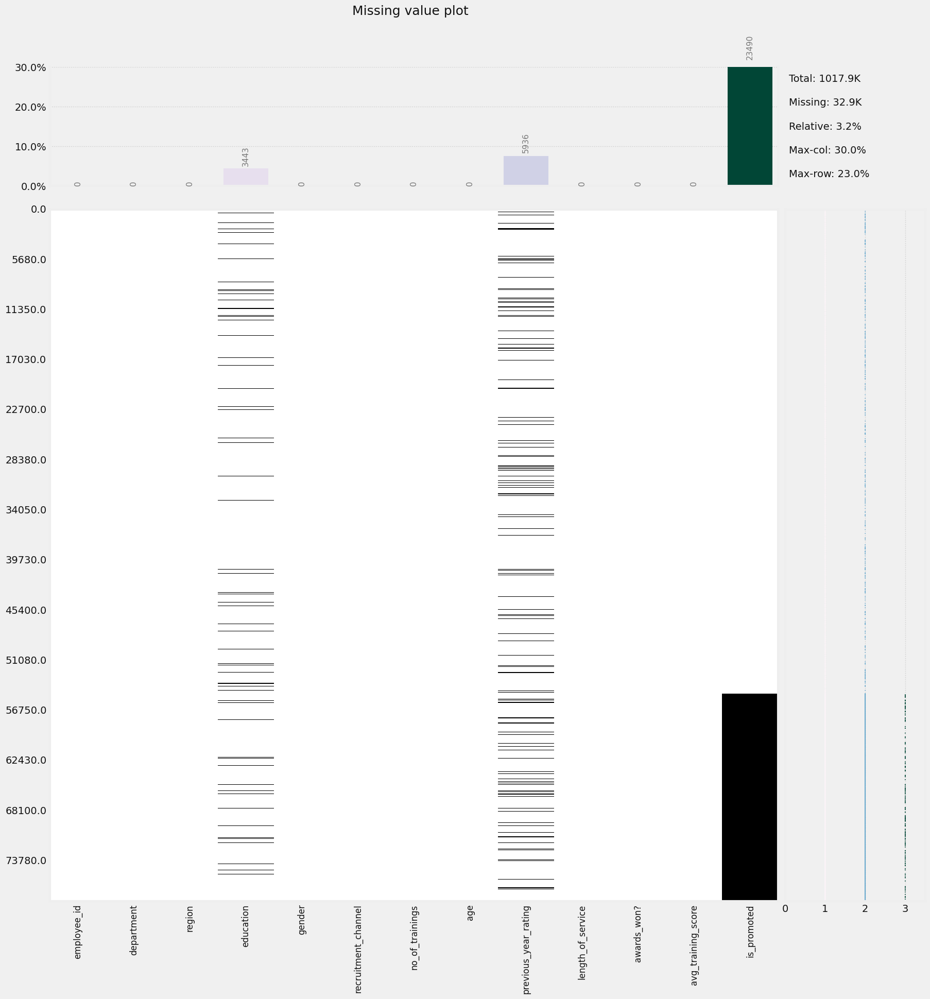

In [75]:
klib.missingval_plot(data)

GridSpec(6, 5)

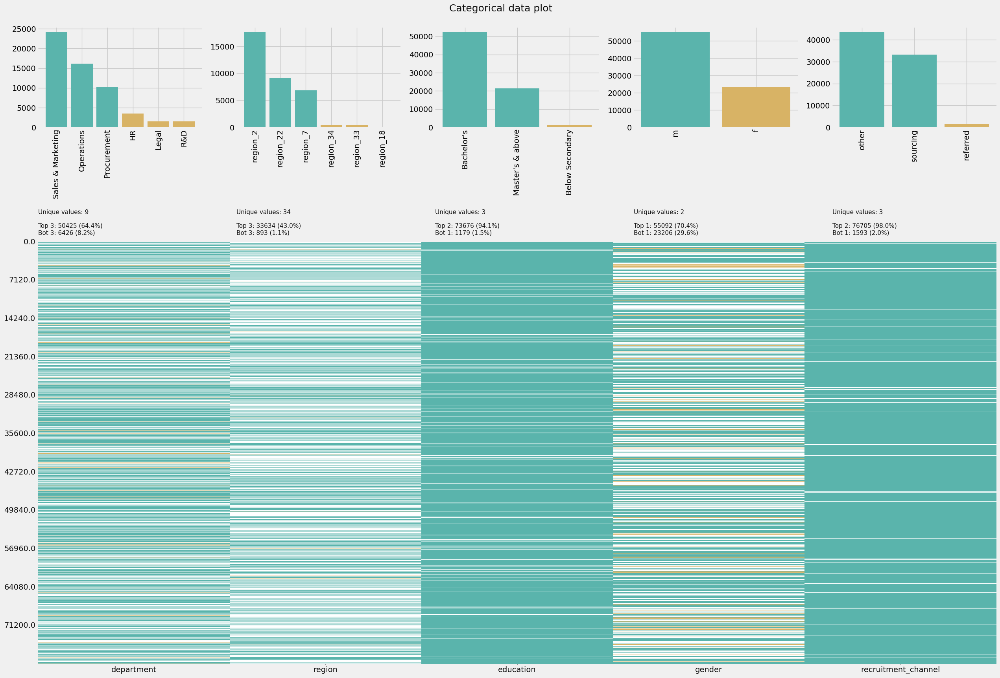

In [76]:
klib.cat_plot(data,figsize = (28, 20))

In [77]:
data.nunique().sort_values()   # no. of unique items per row

gender                      2
awards_won?                 2
is_promoted                 2
education                   3
recruitment_channel         3
previous_year_rating        5
department                  9
no_of_trainings            10
region                     34
length_of_service          35
age                        41
avg_training_score         61
employee_id             78298
dtype: int64

In [78]:
unique_values= data.nunique()

fig = px.bar(unique_values,title='Number of Unique Values', labels = {'x':'', 'y':'Features'}, log_y=True)
fig.update_xaxes(categoryorder='total descending')
fig.update_layout(showlegend=False)

In [79]:
data.isnull().sum()

employee_id                 0
department                  0
region                      0
education                3443
gender                      0
recruitment_channel         0
no_of_trainings             0
age                         0
previous_year_rating     5936
length_of_service           0
awards_won?                 0
avg_training_score          0
is_promoted             23490
dtype: int64

In [80]:
duplicates = data.duplicated()
duplicates.value_counts()

False    78298
dtype: int64

In [81]:
null_rows = data.query('length_of_service == 1')['previous_year_rating'].isnull().sum()
print(f' Rows with null in previous_year_rating and length_of_service >= 1?  \n{null_rows}')

 Rows with null in previous_year_rating and length_of_service >= 1?  
5936


In [82]:
data['previous_year_rating'] = data['previous_year_rating'].fillna(0)
data['education']=data['education'].fillna(data.education.mode()[0])
data['is_promoted']=data['is_promoted'].fillna(data.is_promoted.mode()[0])

In [83]:
data.isnull().sum()

employee_id             0
department              0
region                  0
education               0
gender                  0
recruitment_channel     0
no_of_trainings         0
age                     0
previous_year_rating    0
length_of_service       0
awards_won?             0
avg_training_score      0
is_promoted             0
dtype: int64

In [84]:
klib.missingval_plot(data)

No missing values found in the dataset.


In [85]:
data.drop(['employee_id'], axis="columns", inplace=True)

In [86]:
data = klib.data_cleaning(data)

Shape of cleaned data: (77729, 12) - Remaining NAs: 0


Dropped rows: 569
     of which 569 duplicates. (Rows (first 150 shown): [1100, 4254, 5659, 5889, 5890, 7010, 7858, 7887, 8151, 8912, 9112, 9374, 10170, 10887, 11795, 12740, 13326, 14053, 14328, 14336, 14829, 14847, 14875, 15015, 15139, 15211, 15363, 15598, 15742, 17313, 17314, 17340, 17395, 17717, 18097, 18367, 18374, 18541, 18655, 19893, 19936, 20009, 20209, 20236, 20610, 20914, 21433, 21873, 21958, 22089, 22115, 22848, 23140, 23202, 23500, 23791, 23819, 24014, 24389, 24570, 24778, 24882, 25218, 25400, 25448, 25644, 26120, 26300, 26935, 26978, 26994, 27597, 28047, 28180, 28317, 28709, 28978, 29039, 29107, 29376, 29565, 29974, 30082, 30155, 30252, 30296, 30617, 30670, 30756, 30775, 30800, 30894, 30904, 31408, 31437, 31834, 31917, 32207, 32245, 33186, 33214, 33349, 33636, 33644, 33748, 34040, 34180, 34324, 34428, 34483, 34669, 34993, 35088, 35089, 35196, 35223, 35268, 35303, 35324, 35351, 35407, 35424, 35571, 35598, 35743, 35778, 

In [87]:
data

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,0,49,0.0
1,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,60,0.0
2,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,50,0.0
3,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,50,0.0
4,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,73,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
77724,Legal,region_2,Below Secondary,m,sourcing,1,24,3.0,1,0,61,0.0
77725,Technology,region_25,Bachelor's,m,sourcing,1,31,3.0,7,0,74,0.0
77726,HR,region_16,Bachelor's,f,sourcing,1,26,4.0,4,0,50,0.0
77727,Procurement,region_31,Bachelor's,m,sourcing,3,27,0.0,1,0,70,0.0


In [88]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77729 entries, 0 to 77728
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   department            77729 non-null  category
 1   region                77729 non-null  category
 2   education             77729 non-null  category
 3   gender                77729 non-null  category
 4   recruitment_channel   77729 non-null  category
 5   no_of_trainings       77729 non-null  int8    
 6   age                   77729 non-null  int8    
 7   previous_year_rating  77729 non-null  float32 
 8   length_of_service     77729 non-null  int8    
 9   awards_won            77729 non-null  int8    
 10  avg_training_score    77729 non-null  int8    
 11  is_promoted           77729 non-null  float32 
dtypes: category(5), float32(2), int8(5)
memory usage: 1.3 MB


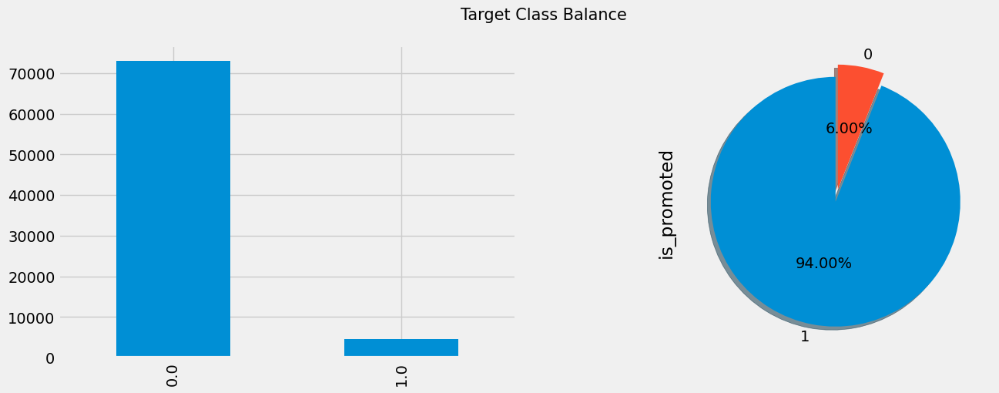

In [89]:
plt.rcParams['figure.figsize'] = (15, 5)
plt.style.use('fivethirtyeight')

plt.subplot(1, 2, 2)
data['is_promoted'].value_counts().plot(kind = 'pie', explode = [0, 0.1], autopct = '%.2f%%', startangle = 90,labels = ['1','0'], shadow = True, pctdistance = 0.5)

plt.subplot(1, 2, 1)
data['is_promoted'].value_counts().plot(kind = 'bar')

plt.suptitle('Target Class Balance', fontsize = 15)
plt.show()


In [90]:
px.histogram(data,x= 'is_promoted', color='gender', pattern_shape="gender",text_auto=True)

In [91]:
px.histogram(data, x = 'age' ,color='education', barmode='group')

In [92]:
px.histogram(data, x = 'age' ,color='gender', barmode='stack', facet_col='is_promoted')

In [93]:
px.histogram(data, x = 'length_of_service' ,color='gender', barmode='stack', facet_col='is_promoted')

In [94]:
px.histogram(data, x = 'recruitment_channel' ,color='is_promoted', barmode='stack').update_xaxes(categoryorder='total ascending')

In [95]:
# px.strip(data, 'length_of_service','age', color='is_promoted')

In [96]:
px.histogram(data, x = 'no_of_trainings' ,color='is_promoted', barmode='stack')

In [97]:
px.histogram(data, x = 'previous_year_rating' ,color='is_promoted', barmode='stack')

In [98]:
px.histogram(data, x = 'awards_won' ,color='is_promoted', barmode='stack')

In [99]:
px.histogram(data, x = 'region' ,color='is_promoted', barmode='stack')

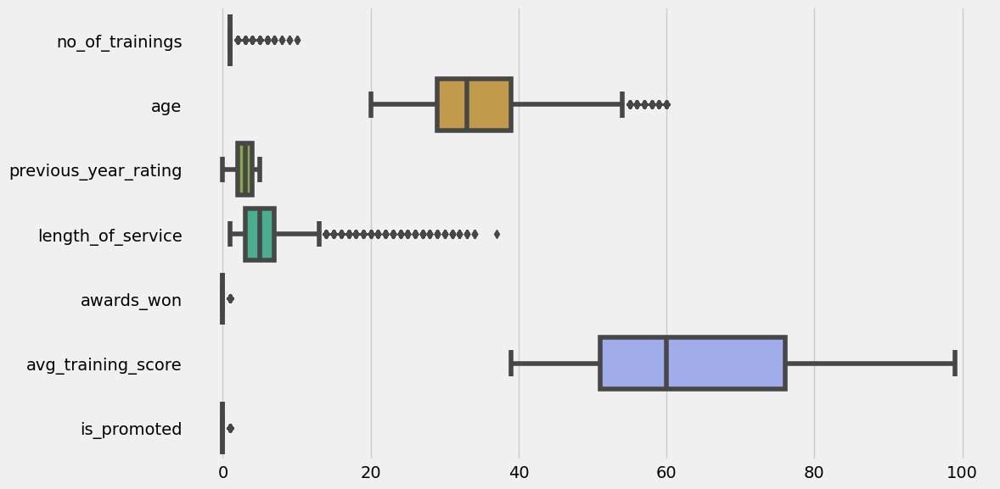

In [100]:
sns.catplot(data, orient="h", kind="box", height=6, aspect=2)
fig = px.box(data, y='length_of_service', points='outliers', title='length_of_service', height = 600)
fig.update_layout(hovermode='x')

In [101]:
data.select_dtypes('number').head()

,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score,is_promoted
0,1,35,5.0,8,0,49,0.0
1,1,30,5.0,4,0,60,0.0
2,1,34,3.0,7,0,50,0.0
3,2,39,1.0,10,0,50,0.0
4,1,45,3.0,2,0,73,0.0


In [102]:
data['length_of_service']=np.where( data['length_of_service']>13,13, data['length_of_service'])
data['length_of_service'].max()

13

In [103]:
label = LabelEncoder()

In [104]:
data['education'].value_counts()

Bachelor's          55165
Master's & above    21402
Below Secondary      1162
Name: education, dtype: int64

In [105]:
data['education'] = data['education'].replace(("Master's & above", "Bachelor's", "Below Secondary"),(2,1,0))
data['education'] = label.fit_transform(data['education'])

In [106]:
data['education'].value_counts()

1    55165
2    21402
0     1162
Name: education, dtype: int64

In [107]:
data['department'] = label.fit_transform(data['department'])
data['region'] = label.fit_transform(data['region'])
data['gender'] = label.fit_transform(data['gender'])
data['recruitment_channel'] = label.fit_transform(data['recruitment_channel'])

In [108]:
X = data.drop(['is_promoted'], axis=1)
Y = data['is_promoted'];

In [109]:
smt = SMOTE()
X_smt, Y_smt = smt.fit_resample(X, Y)

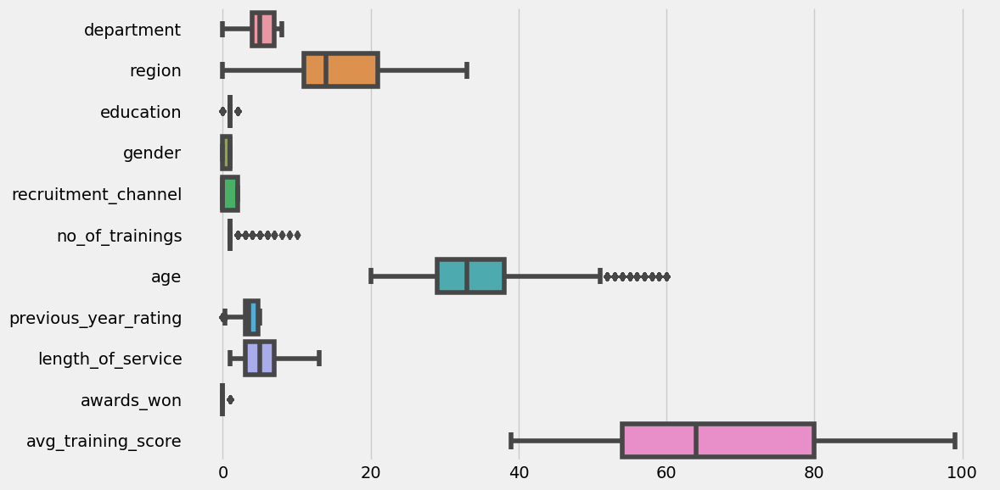

In [110]:
sns.catplot(X_smt, orient="h", kind="box", height=6, aspect=2)

In [111]:
df = pd.concat([Y.to_frame().assign(dataset='Y'), Y_smt.to_frame().assign(dataset='Y_smt')])
px.histogram(df, x='is_promoted', color='dataset', barmode= "group",text_auto=True)

In [112]:
x_train, x_test, y_train, y_test= train_test_split(X_smt,Y_smt, test_size=0.2)
print("X_train => {0}\tY_train => {1}\nX_test => {2}\tY_test => {3}".format(x_train.shape, y_train.shape,x_test.shape,y_test.shape))

X_train => (116902, 11)	Y_train => (116902,)
X_test => (29226, 11)	Y_test => (29226,)


In [125]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(x_train,y_train)
rfc_pred = rf.predict(x_test)

#joblib.dump(model, "models/RandomForestClassifier_model")
print("Accuracy Score of Random Forest Classifier is: {}".format(accuracy_score(y_test, rfc_pred)))
print("Confusion Matrix of Random Forest Classifier is: \n{}\n".format(confusion_matrix(y_test, rfc_pred)))
print("Classification Report of Random Forest Classifier is: \n{}".format(classification_report(y_test,rfc_pred)))
rf_accuracy = accuracy_score(y_test, rfc_pred)
cm = confusion_matrix(y_test, rfc_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of RandomForestClassifier')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of Random Forest Classifier is: 0.9591459659207555
Confusion Matrix of Random Forest Classifier is: 
[[14065   596]
 [  598 13967]]

Classification Report of Random Forest Classifier is: 
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     14661
         1.0       0.96      0.96      0.96     14565

    accuracy                           0.96     29226
   macro avg       0.96      0.96      0.96     29226
weighted avg       0.96      0.96      0.96     29226



In [114]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for GridSearchCV
param_grid = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [None, 5, 10],       # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2, 4]     # Minimum number of samples required to be at a leaf node
}

# Create the RandomForestClassifier
rf = RandomForestClassifier()

# Perform grid search with cross-validation
grid_search = GridSearchCV(rf, param_grid, cv=5)
grid_search.fit(x_train, y_train)

# Get the best parameters and score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print("Best Parameters: ", best_params)
print("Best Score: ", best_score)

# Train the RandomForestClassifier with the best parameters
rf = RandomForestClassifier(**best_params)
rf.fit(x_train, y_train)
rfc_pred = rf.predict(x_test)

# Print evaluation metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report



print("Accuracy Score of Random Forest Classifier is: {}".format(accuracy_score(y_test, rfc_pred)))
print("Confusion Matrix of Random Forest Classifier is: \n{}\n".format(confusion_matrix(y_test, rfc_pred)))
print("Classification Report of Random Forest Classifier is: \n{}".format(classification_report(y_test, rfc_pred)))
rfc_accuracy = accuracy_score(y_test, rfc_pred)
cm = confusion_matrix(y_test, rfc_pred)
fig = px.imshow(cm, text_auto=True, title='Confusion Matrix of RandomForestClassifier')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')


Best Parameters:  {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}
Best Score:  0.9528664995218676
Accuracy Score of Random Forest Classifier is: 0.9603435297337987
Confusion Matrix of Random Forest Classifier is: 
[[14082   579]
 [  580 13985]]

Classification Report of Random Forest Classifier is: 
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96     14661
         1.0       0.96      0.96      0.96     14565

    accuracy                           0.96     29226
   macro avg       0.96      0.96      0.96     29226
weighted avg       0.96      0.96      0.96     29226



In [115]:
from sklearn.tree import DecisionTreeClassifier

dt = DecisionTreeClassifier()
dt.fit(x_train, y_train)
dtc_pred = dt.predict(x_test)

print("Accuracy Score of Decision Tree Classifier is: {}".format(accuracy_score(y_test, dtc_pred)))
print("Confusion Matrix of Decision Tree Classifier is: \n{}\n".format(confusion_matrix(y_test, dtc_pred)))
print("Classification Report of Decision Tree Classifier is: \n{}".format(classification_report(y_test,dtc_pred)))
dtc_accuracy = accuracy_score(y_test, dtc_pred)
cm = confusion_matrix(y_test, dtc_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of DecisionTreeClassifier')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of Decision Tree Classifier is: 0.9327995620338055
Confusion Matrix of Decision Tree Classifier is: 
[[13330  1331]
 [  633 13932]]

Classification Report of Decision Tree Classifier is: 
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93     14661
         1.0       0.91      0.96      0.93     14565

    accuracy                           0.93     29226
   macro avg       0.93      0.93      0.93     29226
weighted avg       0.93      0.93      0.93     29226



In [116]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV

max_depth_range = np.arange(1, 100)
tree_param = [{'criterion': ['entropy', 'gini'], 'max_depth': max_depth_range}]
clf_tree = GridSearchCV(DecisionTreeClassifier(), tree_param, cv=5, scoring='f1_weighted')
clf_tree.fit(x_train, y_train)

clf_tree.best_params_

{'criterion': 'entropy', 'max_depth': 80}

In [117]:

dt = DecisionTreeClassifier(criterion='entropy', max_depth=60)
dt.fit(x_train, y_train)
dtc_pred = dt.predict(x_test)

print("Accuracy Score of Decision Tree Classifier is: {}".format(accuracy_score(y_test, dtc_pred)))
print("Confusion Matrix of Decision Tree Classifier is: \n{}\n".format(confusion_matrix(y_test, dtc_pred)))
print("Classification Report of Decision Tree Classifier is: \n{}".format(classification_report(y_test,dtc_pred)))
dtc_accuracy = accuracy_score(y_test, dtc_pred)
cm = confusion_matrix(y_test, dtc_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of DecisionTreeClassifier')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of Decision Tree Classifier is: 0.9327311298159173
Confusion Matrix of Decision Tree Classifier is: 
[[13372  1289]
 [  677 13888]]

Classification Report of Decision Tree Classifier is: 
              precision    recall  f1-score   support

         0.0       0.95      0.91      0.93     14661
         1.0       0.92      0.95      0.93     14565

    accuracy                           0.93     29226
   macro avg       0.93      0.93      0.93     29226
weighted avg       0.93      0.93      0.93     29226



In [118]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(x_train, y_train)
lr_pred = lr.predict(x_test)

print("Accuracy Score of Logistic Regression is: {}".format(accuracy_score(y_test, lr_pred)))
print("Confusion Matrix of Logistic Regression is: \n{}\n".format(confusion_matrix(y_test, lr_pred)))
print("Classification Report of Logistic Regression is: \n{}".format(classification_report(y_test,lr_pred)))
lr_accuracy = accuracy_score(y_test, lr_pred)
cm = confusion_matrix(y_test, lr_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of Logistic Regression')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of Logistic Regression is: 0.688633408608773
Confusion Matrix of Logistic Regression is: 
[[ 9833  4828]
 [ 4272 10293]]

Classification Report of Logistic Regression is: 
              precision    recall  f1-score   support

         0.0       0.70      0.67      0.68     14661
         1.0       0.68      0.71      0.69     14565

    accuracy                           0.69     29226
   macro avg       0.69      0.69      0.69     29226
weighted avg       0.69      0.69      0.69     29226



c:\Users\VJ\anaconda3\envs\workshop\Lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



In [119]:
from sklearn.neural_network import MLPClassifier

mlp = MLPClassifier()
mlp.fit(x_train, y_train)
mlp_pred = mlp.predict(x_test)

print("Accuracy Score of MLP Classifier is: {}".format(accuracy_score(y_test, mlp_pred)))
print("Confusion Matrix of MLP Classifier is: \n{}\n".format(confusion_matrix(y_test, mlp_pred)))
print("Classification Report of MLP Classifier is: \n{}".format(classification_report(y_test,mlp_pred)))
mlp_accuracy = accuracy_score(y_test, mlp_pred)
cm = confusion_matrix(y_test, mlp_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of  MLPClassifier')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of MLP Classifier is: 0.7620953945117361
Confusion Matrix of MLP Classifier is: 
[[10725  3936]
 [ 3017 11548]]

Classification Report of MLP Classifier is: 
              precision    recall  f1-score   support

         0.0       0.78      0.73      0.76     14661
         1.0       0.75      0.79      0.77     14565

    accuracy                           0.76     29226
   macro avg       0.76      0.76      0.76     29226
weighted avg       0.76      0.76      0.76     29226



c:\Users\VJ\anaconda3\envs\workshop\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:686: ConvergenceWarning:

Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.



In [120]:
from sklearn.naive_bayes import GaussianNB

gnb = GaussianNB()
gnb.fit(x_train, y_train)
gnb_pred = gnb.predict(x_test)

print("Accuracy Score of GaussianNB is: {}".format(accuracy_score(y_test, gnb_pred)))
print("Confusion Matrix of GaussianNB is: \n{}\n".format(confusion_matrix(y_test, gnb_pred)))
print("Classification Report of GaussianNB is: \n{}".format(classification_report(y_test,gnb_pred)))
gnb_accuracy = accuracy_score(y_test, gnb_pred)
cm = confusion_matrix(y_test, gnb_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of  GaussianNB')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of GaussianNB is: 0.6693355231643058
Confusion Matrix of GaussianNB is: 
[[ 8424  6237]
 [ 3427 11138]]

Classification Report of GaussianNB is: 
              precision    recall  f1-score   support

         0.0       0.71      0.57      0.64     14661
         1.0       0.64      0.76      0.70     14565

    accuracy                           0.67     29226
   macro avg       0.68      0.67      0.67     29226
weighted avg       0.68      0.67      0.67     29226



In [121]:
from sklearn.svm import SVC

svc = SVC()
svc.fit(x_train, y_train)
svc_pred = svc.predict(x_test)

print("Accuracy Score of SVC is: {}".format(accuracy_score(y_test, svc_pred)))
print("Confusion Matrix of SVC is: \n{}\n".format(confusion_matrix(y_test, svc_pred)))
print("Classification Report of SVC is: \n{}".format(classification_report(y_test,svc_pred)))
svc_accuracy = accuracy_score(y_test, svc_pred)
cm = confusion_matrix(y_test, svc_pred)
fig = px.imshow(cm,text_auto=True, title='Confusion Matrix of  SVC')
fig.update_layout(xaxis_title='Actual', yaxis_title='Predicted')

Accuracy Score of SVC is: 0.6972216519537399
Confusion Matrix of SVC is: 
[[10110  4551]
 [ 4298 10267]]

Classification Report of SVC is: 
              precision    recall  f1-score   support

         0.0       0.70      0.69      0.70     14661
         1.0       0.69      0.70      0.70     14565

    accuracy                           0.70     29226
   macro avg       0.70      0.70      0.70     29226
weighted avg       0.70      0.70      0.70     29226



In [126]:
# Create a dictionary with accuracy values
accuracy_dict = {
    'Model': ['Random Forest Classifier','Decision Tree Classifier', 'Logistic Regression', 'MLP Classifier', 'Gaussian Naive Bayes','C-Support Vector Classification.'],
    'Accuracy': [rf_accuracy, dtc_accuracy, lr_accuracy, mlp_accuracy, gnb_accuracy, svc_accuracy]
}

# Create a pandas DataFrame from the dictionary
accuracy_df = pd.DataFrame(accuracy_dict)

print(accuracy_df)

                              Model  Accuracy
0          Random Forest Classifier  0.959146
1          Decision Tree Classifier  0.932731
2               Logistic Regression  0.688633
3                    MLP Classifier  0.762095
4              Gaussian Naive Bayes  0.669336
5  C-Support Vector Classification.  0.697222


In [123]:
pickle.dump(rf, open('models/model.pkl','wb'))

In [130]:
prediction = rf.predict(np.array([[ 2, #department code
                                    10, #region code
                                    3, #masters degree
                                    1, #male
                                    1, #recruitment channel
                                    1, #1 training
                                    30, #30 years old
                                    5, #previous year rating
                                    10, #length of service
                                    1, #awards won
                                    95, #avg training score
                                    ]]))

print("Employee should get a Promotion : 1-> Promotion, and 0-> No Promotion :", prediction)

Employee should get a Promotion : 1-> Promotion, and 0-> No Promotion : [1.]


c:\Users\VJ\anaconda3\envs\workshop\Lib\site-packages\sklearn\base.py:439: UserWarning:

X does not have valid feature names, but RandomForestClassifier was fitted with feature names



In [131]:
x_train.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,awards_won,avg_training_score
99013,7,4,1,1,2,1,30,4.806313,4,0,52
44591,8,25,1,1,0,1,34,3.000000,6,0,82
73477,5,4,1,0,2,2,27,3.000000,3,0,67
5741,4,24,1,1,2,1,28,3.000000,3,0,60
119484,4,19,2,1,0,1,43,4.118389,12,0,69
